In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split ,GridSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
import klib as kl

import warnings
warnings.filterwarnings("ignore")

In [3]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, ExtraTreesClassifier, BaggingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier, Perceptron
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis, LinearDiscriminantAnalysis
import xgboost as xgb
import lightgbm as lgb
from catboost import CatBoostClassifier

In [4]:
df = pd.read_csv("pokemon_alopez247.csv")
df

,Number,Name,Type_1,Type_2,Total,HP,Attack,Defense,Sp_Atk,Sp_Def,...,Color,hasGender,Pr_Male,Egg_Group_1,Egg_Group_2,hasMegaEvolution,Height_m,Weight_kg,Catch_Rate,Body_Style
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,...,Green,True,0.875,Monster,Grass,False,0.71,6.9,45,quadruped
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,...,Green,True,0.875,Monster,Grass,False,0.99,13.0,45,quadruped
2,3,Venusaur,Grass,Poison,525,80,82,83,100,100,...,Green,True,0.875,Monster,Grass,True,2.01,100.0,45,quadruped
3,4,Charmander,Fire,NaN,309,39,52,43,60,50,...,Red,True,0.875,Monster,Dragon,False,0.61,8.5,45,bipedal_tailed
4,5,Charmeleon,Fire,NaN,405,58,64,58,80,65,...,Red,True,0.875,Monster,Dragon,False,1.09,19.0,45,bipedal_tailed
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
716,717,Yveltal,Dark,Flying,680,126,131,95,131,98,...,Red,False,NaN,Undiscovered,NaN,False,5.79,203.0,45,two_wings
717,718,Zygarde,Dragon,Ground,600,108,100,121,81,95,...,Green,False,NaN,Undiscovered,NaN,False,5.00,305.0,3,serpentine_body
718,719,Diancie,Rock,Fairy,600,50,100,150,100,150,...,Pink,False,NaN,Undiscovered,NaN,True,0.71,8.8,3,head_arms
719,720,Hoopa,Psychic,Ghost,600,80,110,60,150,130,...,Purple,False,NaN,Undiscovered,NaN,False,0.51,9.0,3,head_only


In [5]:
df.describe()

,Number,Total,HP,Attack,Defense,Sp_Atk,Sp_Def,Speed,Generation,Pr_Male,Height_m,Weight_kg,Catch_Rate
count,721.00000,721.000000,721.000000,721.000000,721.000000,721.000000,721.000000,721.000000,721.000000,644.000000,721.000000,721.000000,721.000000
mean,361.00000,417.945908,68.380028,75.013870,70.808599,68.737864,69.291262,65.714286,3.323162,0.553377,1.144979,56.773370,100.246879
std,208.27906,109.663671,25.848272,28.984475,29.296558,28.788005,27.015860,27.277920,1.669873,0.199969,1.044369,89.095667,76.573513
min,1.00000,180.000000,1.000000,5.000000,5.000000,10.000000,20.000000,5.000000,1.000000,0.000000,0.100000,0.100000,3.000000
25%,181.00000,320.000000,50.000000,53.000000,50.000000,45.000000,50.000000,45.000000,2.000000,0.500000,0.610000,9.400000,45.000000
50%,361.00000,424.000000,65.000000,74.000000,65.000000,65.000000,65.000000,65.000000,3.000000,0.500000,0.990000,28.000000,65.000000
75%,541.00000,499.000000,80.000000,95.000000,85.000000,90.000000,85.000000,85.000000,5.000000,0.500000,1.400000,61.000000,180.000000
max,721.00000,720.000000,255.000000,165.000000,230.000000,154.000000,230.000000,160.000000,6.000000,1.000000,14.500000,950.000000,255.000000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 721 entries, 0 to 720
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Number            721 non-null    int64  
 1   Name              721 non-null    object 
 2   Type_1            721 non-null    object 
 3   Type_2            350 non-null    object 
 4   Total             721 non-null    int64  
 5   HP                721 non-null    int64  
 6   Attack            721 non-null    int64  
 7   Defense           721 non-null    int64  
 8   Sp_Atk            721 non-null    int64  
 9   Sp_Def            721 non-null    int64  
 10  Speed             721 non-null    int64  
 11  Generation        721 non-null    int64  
 12  isLegendary       721 non-null    bool   
 13  Color             721 non-null    object 
 14  hasGender         721 non-null    bool   
 15  Pr_Male           644 non-null    float64
 16  Egg_Group_1       721 non-null    object 
 1

# Veriseti Düzenleme

Öncelikle verisetinde boş değerler olup olmadığını kontrol etmemiz gerekir.

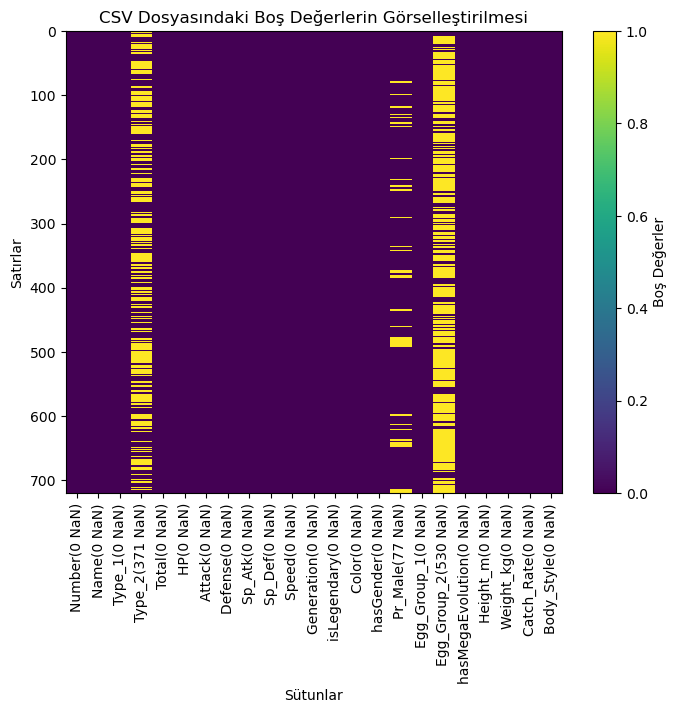

In [9]:
# Her sütunda kaç tane boş değer olduğunu hesaplama
nan_matrix = df.isna()
nan_counts = nan_matrix.sum()

plt.figure(figsize=(8, 6))  
plt.imshow(nan_matrix, aspect='auto', cmap='viridis', interpolation='none')
plt.colorbar(label='Boş Değerler')  

plt.title('CSV Dosyasındaki Boş Değerlerin Görselleştirilmesi')
plt.xlabel('Sütunlar')
plt.ylabel('Satırlar')

plt.xticks(ticks=np.arange(len(df.columns)), labels=[f'{col}({nan_counts[col]} NaN)' for col in df.columns], rotation=90)

plt.show()

Numerik boş değerleri ortalaması ile, kategorik değerleri de 2.özelliği olmayan kolunun ilk özellikleri ile dolduruyorum.

In [15]:
#Pr_Male kolonunda boş kalan değerleri Pr_Male kolonu ortalaması ile doldurma
df["Pr_Male"] = df["Pr_Male"].fillna(df["Pr_Male"].mean())
df.Pr_Male.isna().sum()

0

In [16]:
#Type_2 kolonunda boş kalan değerleri Type_1 ile doldurma
df["Type_2"] = df["Type_2"].combine_first(df["Type_1"])
df.Type_2.isna().sum()

0

In [17]:
# Type_2 kolonunda boş kalan değerleri Type_1 ile doldurma
df["Egg_Group_2"] = df["Egg_Group_2"].combine_first(df["Egg_Group_1"])
df.Egg_Group_2.isna().sum()

0

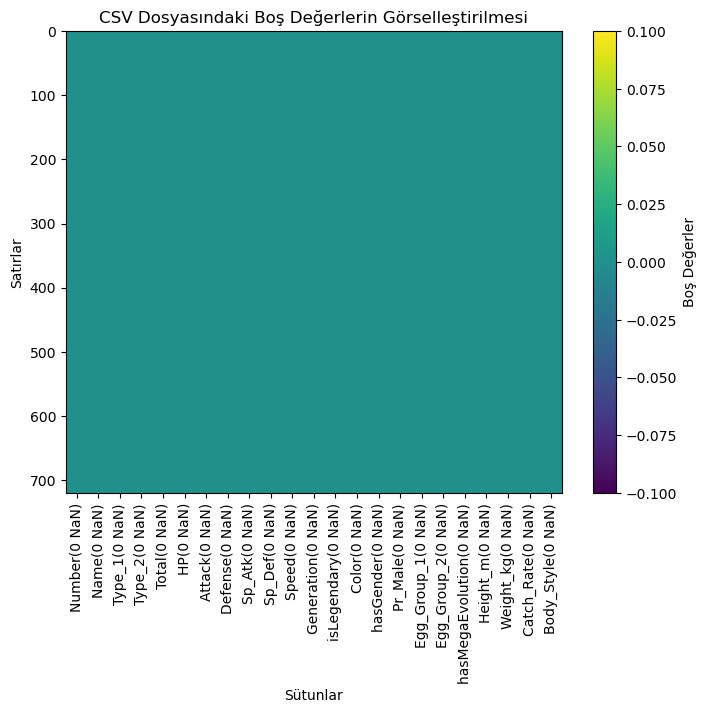

In [18]:
#Emin olmak için aynı görselleştirme işlemini tekrar yapalım
nan_matrix_last = df.isna()
nan_counts_last = nan_matrix_last.sum()

plt.figure(figsize=(8, 6)) 
plt.imshow(nan_matrix_last, aspect='auto', cmap='viridis', interpolation='none')
plt.colorbar(label='Boş Değerler') 

plt.title('CSV Dosyasındaki Boş Değerlerin Görselleştirilmesi')
plt.xlabel('Sütunlar')
plt.ylabel('Satırlar')

plt.xticks(ticks=np.arange(len(df.columns)), labels=[f'{col}({nan_counts_last[col]} NaN)' for col in df.columns], rotation=90)

plt.show()

## Biraz veri seti hakkında bilgi edinelim

Type_1
Water       105
Normal       93
Grass        66
Bug          63
Fire         47
Psychic      47
Rock         41
Electric     36
Ground       30
Poison       28
Dark         28
Fighting     25
Dragon       24
Ghost        23
Ice          23
Steel        22
Fairy        17
Flying        3
Name: count, dtype: int64

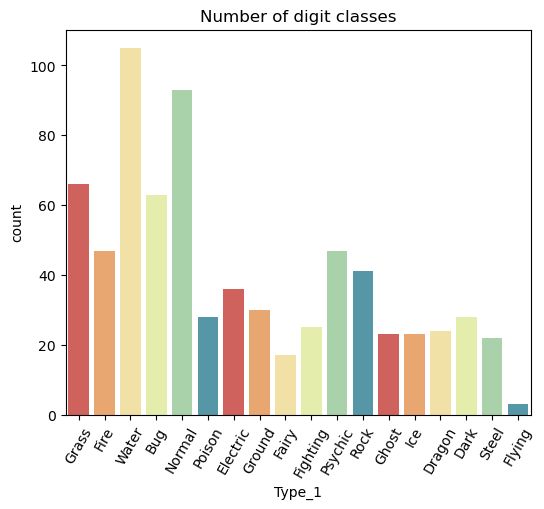

In [24]:
palette = sns.color_palette("Spectral", as_cmap=False)

plt.figure(figsize=(6,5))
g = sns.countplot(x=df['Type_1'], palette=palette)
plt.title("Number of digit classes")
plt.xticks(rotation=60)
df['Type_1'].value_counts()

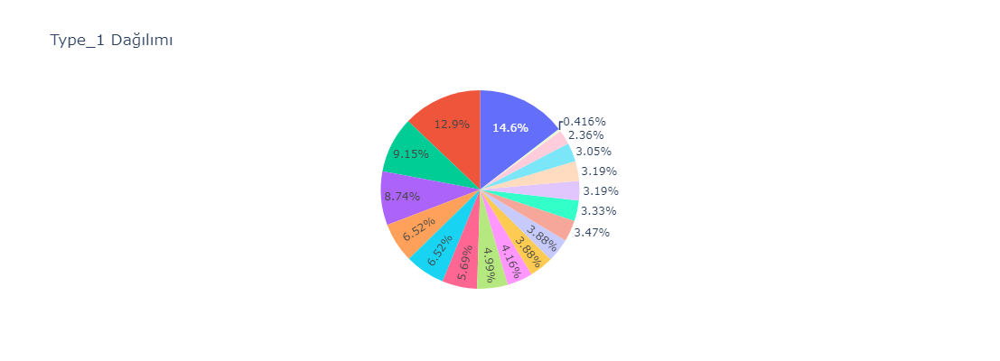

In [25]:
label = df['Type_1'].unique()
values=df['Type_1'].value_counts()
fig = px.pie(labels=label, values=values,title='Type_1 Dağılımı',)
fig.update_layout(height=400, width=500)

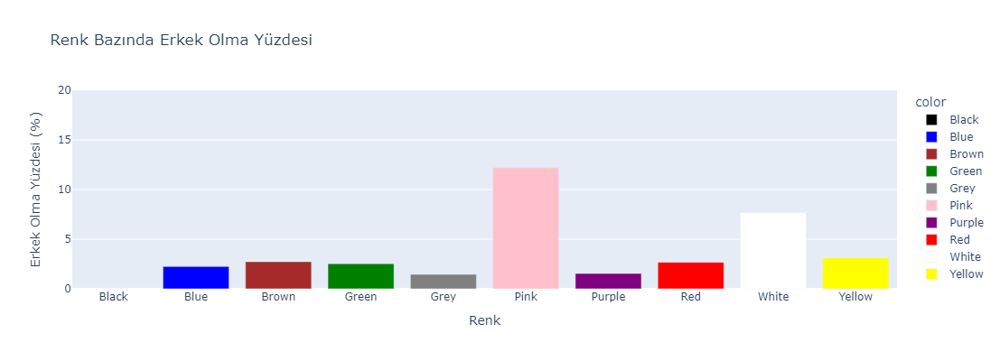

In [27]:
# Her renk için erkek olma yüzdesini hesaplama
gender_percent = df[df['Pr_Male'] == 0].groupby('Color').size() / df.groupby('Color').size() * 100

fig = px.bar(
    x=gender_percent.index, 
    y=gender_percent.values, 
    color=gender_percent.index, 
    color_discrete_map={
        'Green': 'green',
        'Red': 'red',
        'Blue': 'blue',
        'White': 'white',
        'Brown': 'brown',
        'Yellow': 'yellow',
        'Purple': 'purple',
        'Pink': 'pink',
        'Grey': 'grey',
        'Black': 'black'
    },
    title='Renk Bazında Erkek Olma Yüzdesi',
    labels={'x': 'Renk', 'y': 'Erkek Olma Yüzdesi (%)'},
    range_y=[0, 20]
)

fig.update_layout(
    width=600, 
    height=400 
)

fig.show()

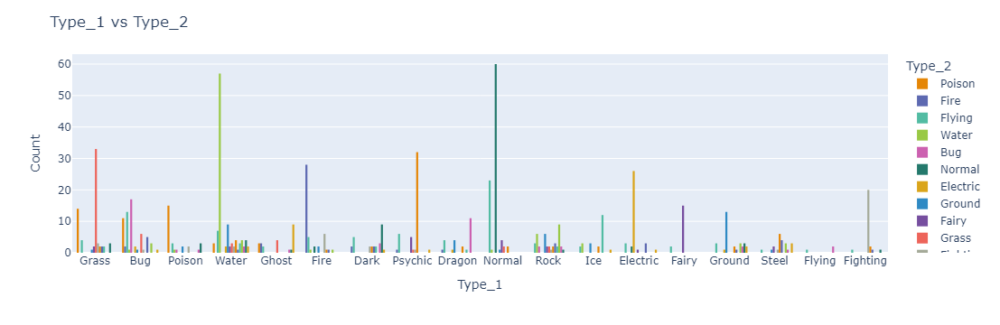

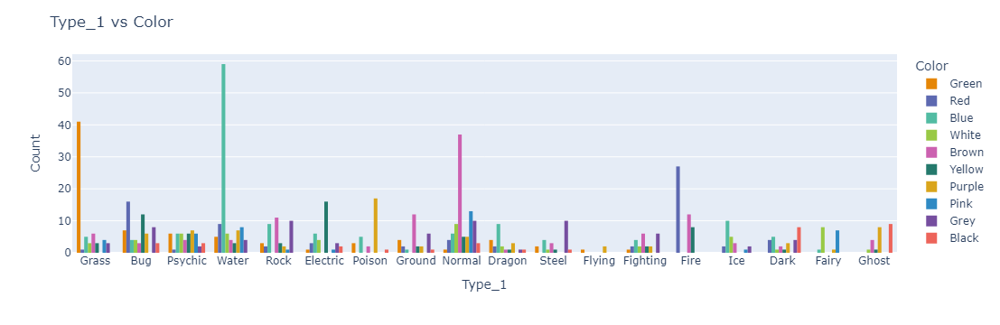

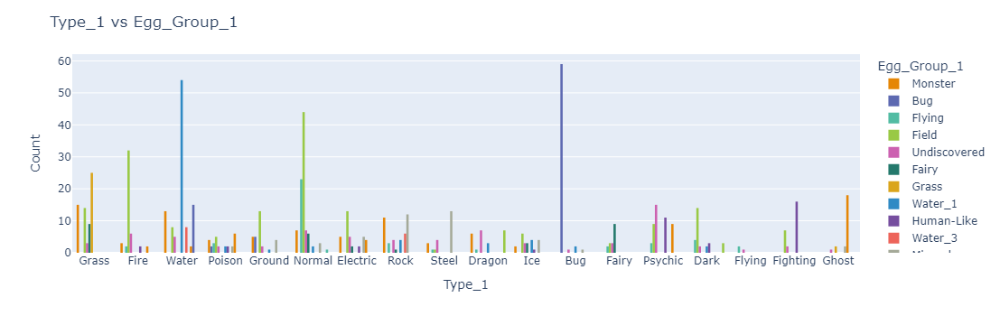

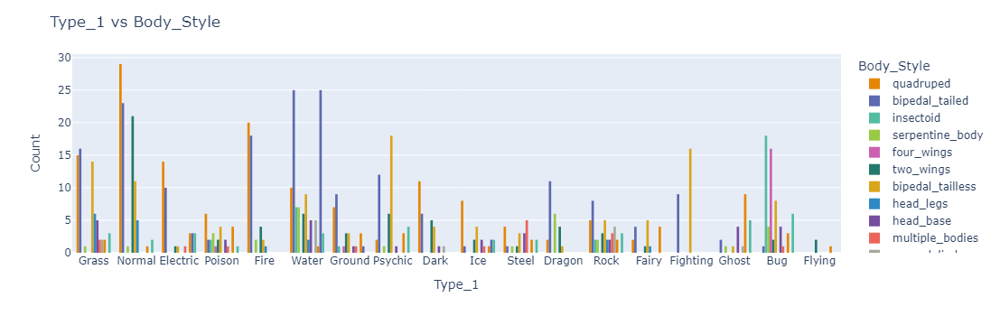

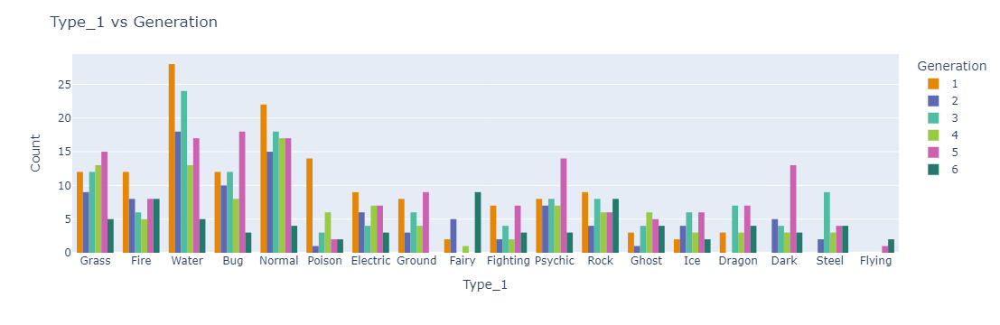

In [28]:
#Her kolonun Type_1 kolonu ile alakasını görselleştirme
selected_columns = ['Type_2', 'Color', 'Egg_Group_1', 'Body_Style', 'Generation'] 

for col in selected_columns:
    fig = px.histogram(df, x='Type_1', color=col, barmode='group',
                       color_discrete_sequence=px.colors.qualitative.Vivid)
    fig.update_layout(title_text=f'Type_1 vs {col}', xaxis_title='Type_1', yaxis_title='Count')
    fig.show()

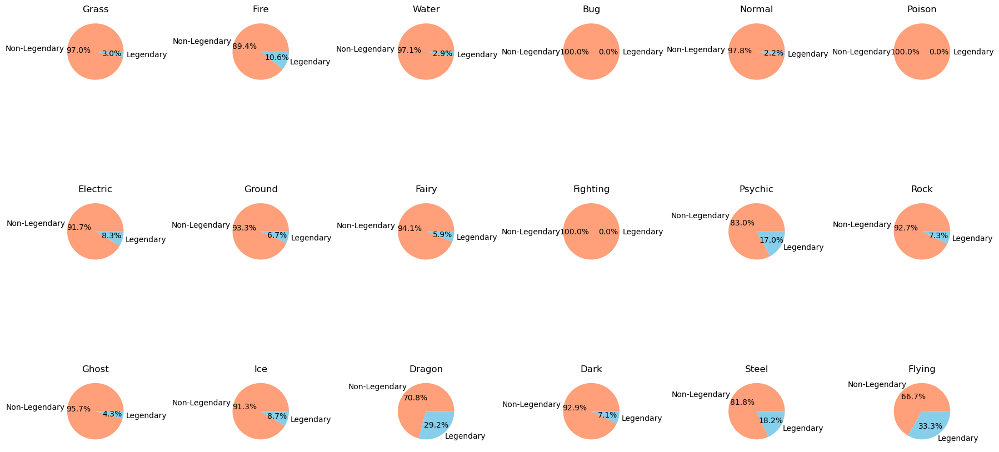

In [30]:
#Type_1 kolonundaki özelliklerin isLegendery olup olmamasını görselleştirme
type_1_values = df['Type_1'].unique()

rows, cols = 3, 6

plt.figure(figsize=(18, 10))

for i, type_1 in enumerate(type_1_values, 1):
    plt.subplot(rows, cols, i)
    legendary_counts = df[df['Type_1'] == type_1]['isLegendary'].value_counts()
    legendary_counts = legendary_counts.reindex([False, True], fill_value=0)
    plt.pie(legendary_counts, labels=['Non-Legendary', 'Legendary'], autopct='%1.1f%%', colors=['lightsalmon', 'skyblue'])
    plt.title(type_1)

plt.tight_layout()
plt.show()

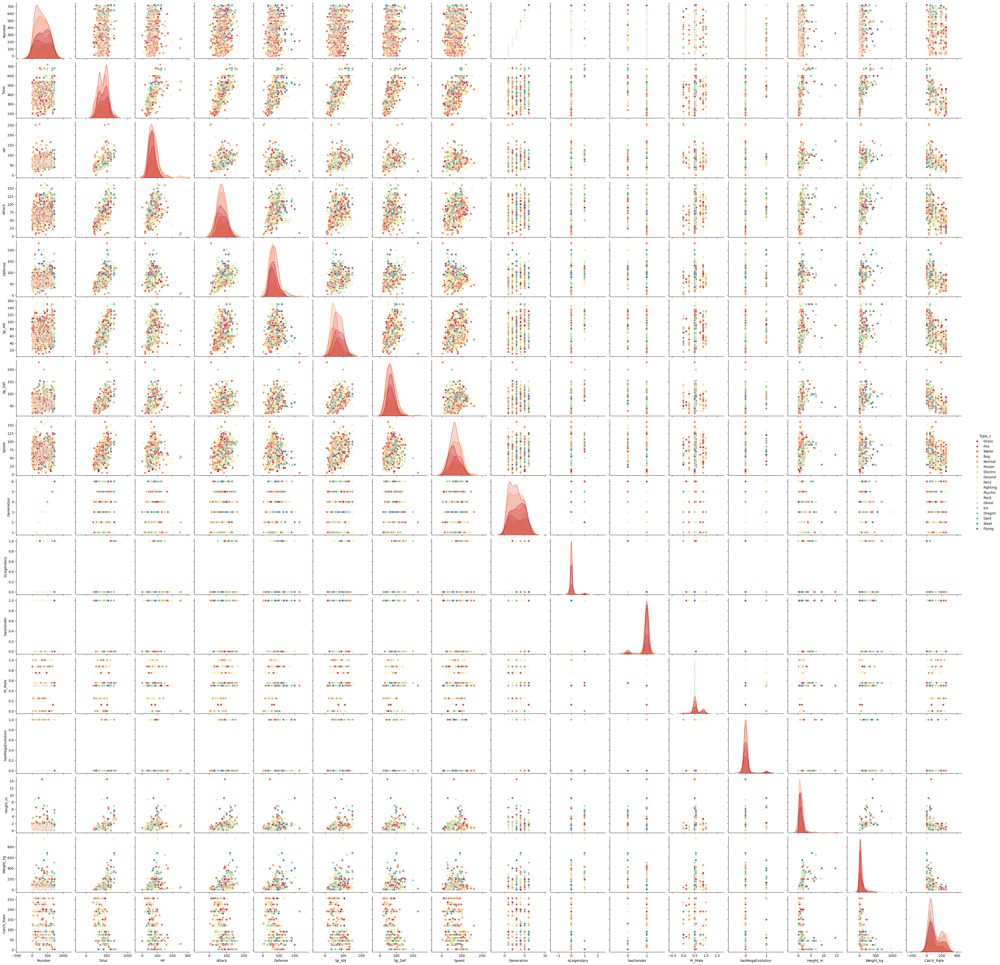

In [60]:
#Veri setinizdeki sayısal özellikleri Type_1'e nasıl göre nasıl dağıldığını görselleştirdik
sns.pairplot(df, hue='Type_1', palette='Spectral')
plt.show()

## Y değeri için korelasyon bulma

In [62]:
#Korelasyonu bulabilmek için "object" olan Type_1 kolonunu LabelEncoder ile numerik değerlere dönüştürdük
label_encoder = LabelEncoder()
df['Type_1'] = label_encoder.fit_transform(df[['Type_1']])

<Axes: title={'center': 'Feature-correlation (pearson)'}>

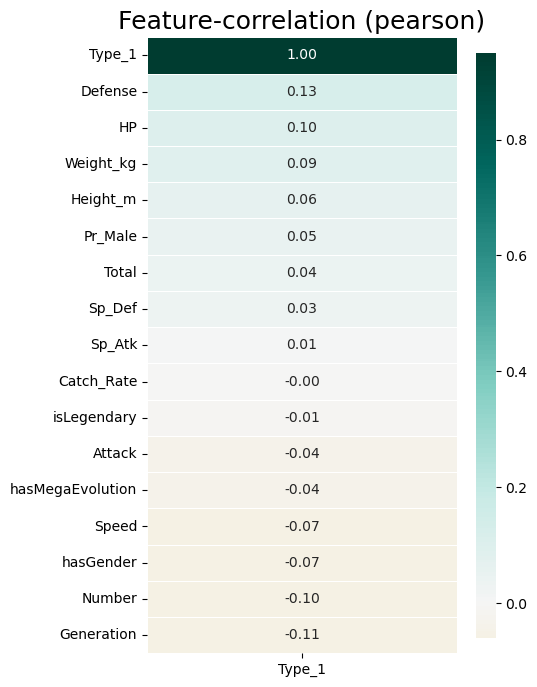

In [64]:
# Type_1 kolonun diğer kolonlar ile korelasyonu
kl.corr_plot(df,figsize=(5,8),target=df['Type_1'])

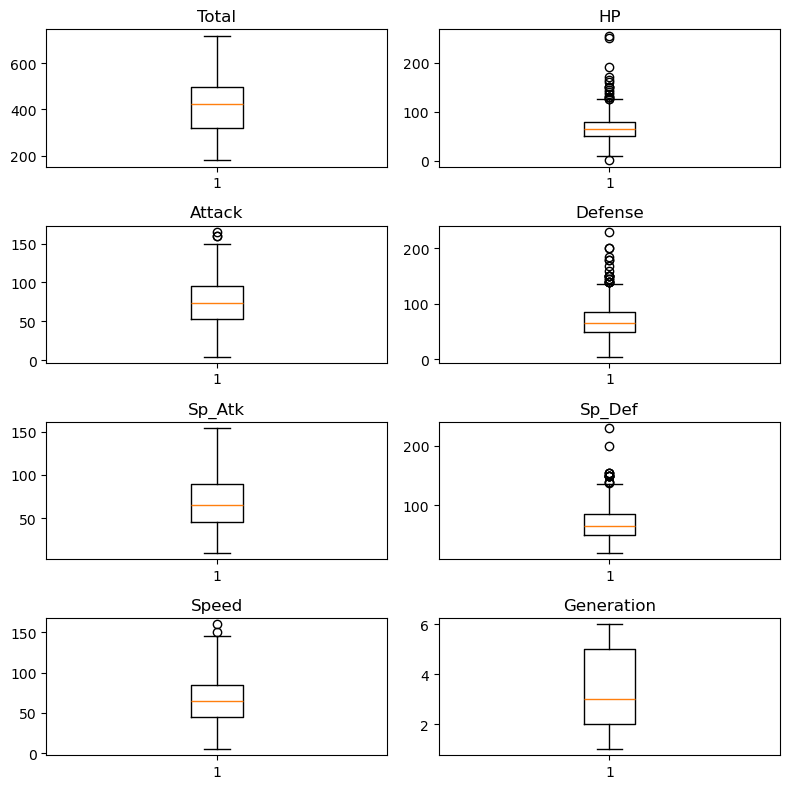

In [65]:
# Numerik kolonların değerlerine bakıyouruz. Aykırı değerleri görmek istiyoruz.
n1 = df[['Total', 'HP', 'Attack', 'Defense', 'Sp_Atk', 'Sp_Def', 'Speed', 'Generation']]
plt.figure(figsize=(8, 8))

for i, col in enumerate(n1.columns, 1):
    plt.subplot(4, 2, i)
    plt.boxplot(n1[col])
    plt.title(col)

plt.tight_layout()
plt.show()

Aykırı değerler çıkarıldıktan sonra temiz veri:
     Total   HP  Attack  Defense  Sp_Atk  Sp_Def  Speed  Generation
0      318   45      49       49      65      65     45           1
1      405   60      62       63      80      80     60           1
2      525   80      82       83     100     100     80           1
3      309   39      52       43      60      50     65           1
4      405   58      64       58      80      65     80           1
..     ...  ...     ...      ...     ...     ...    ...         ...
713    245   40      30       35      45      40     55           6
714    535   85      70       80      97      80    123           6
717    600  108     100      121      81      95     95           6
719    600   80     110       60     150     130     70           6
720    600   80     110      120     130      90     70           6

[672 rows x 8 columns]


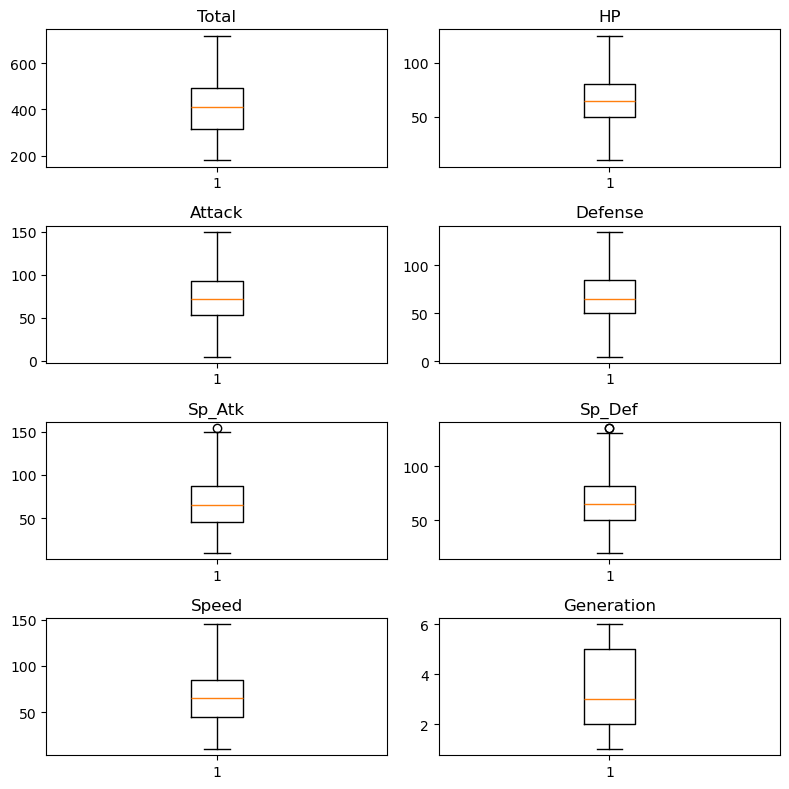

In [67]:
# Aykırı değerleri tespit edip silmek için IQR yöntemini kullanıyoruz
def remove_outliers(df, columns):
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    return df

df_cleaned = remove_outliers(n1, n1.columns)

print("Aykırı değerler çıkarıldıktan sonra temiz veri:")
print(df_cleaned)

plt.figure(figsize=(8, 8)) 

for i, col in enumerate(df_cleaned.columns, 1):
    plt.subplot(4, 2, i)
    plt.boxplot(df_cleaned[col])
    plt.title(col)

plt.tight_layout()
plt.show()

In [69]:
# Kullanılmayacak kolonları siliyoruz
df = df.drop(columns=["Name", 'Number'], axis=1)

In [74]:
# LabelEncoder ve OneHotEncoder oluşturma
label_encoder = LabelEncoder()
one_hot_encoder = OneHotEncoder(sparse_output=False)

Kaç (Benzersiz) Unique Değer Varsa Ona Göre Sınıflandırma Kategorisi Seçmeliyiz:  
Az Sayıda Unique Değer: Eğer kolon az sayıda benzersiz değere sahipse (örneğin, 10'dan az), One-Hot Encoding veya Label Encoding tercih edilebilir.  
Orta Derecede Unique Değer: Eğer kolon orta sayıda benzersiz değere sahipse (örneğin, 10 ile 100 arasında), Ordinal Encoding kullanılabilir.
Çok Sayıda Unique Değer: Eğer kolon çok sayıda benzersiz değere sahipse (örneğin, 100'den fazla), Target Encoding veya Frequency Encoding gibi yöntemler kullanılabilir.

Label Encoding: Sıralı (ordinal) kategorik veriler ve ağaç tabanlı modeller için uygundur.
One-Hot Encoding: Sırasız (nominal) kategorik veriler ve mesafe tabanlı veya lineer modeller için uygundur.

In [79]:
one_hot_features = ['Type_2', 'Color', 'Egg_Group_1', 'Egg_Group_2', 'Body_Style', 'isLegendary', 'hasMegaEvolution', 'hasGender']

df = pd.get_dummies(df, columns=one_hot_features, drop_first=False)

In [81]:
df['Pr_Male'] = label_encoder.fit_transform(df[['Pr_Male']])
df['Generation'] = label_encoder.fit_transform(df[['Generation']])

In [83]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 721 entries, 0 to 720
Data columns (total 91 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Type_1                       721 non-null    int32  
 1   Total                        721 non-null    int64  
 2   HP                           721 non-null    int64  
 3   Attack                       721 non-null    int64  
 4   Defense                      721 non-null    int64  
 5   Sp_Atk                       721 non-null    int64  
 6   Sp_Def                       721 non-null    int64  
 7   Speed                        721 non-null    int64  
 8   Generation                   721 non-null    int64  
 9   Pr_Male                      721 non-null    int64  
 10  Height_m                     721 non-null    float64
 11  Weight_kg                    721 non-null    float64
 12  Catch_Rate                   721 non-null    int64  
 13  Type_2_Bug          

Veri setindeki farklı özellikler genellikle farklı birimlerde olabilir. MinMaxScaler, tüm özelliklerin aynı aralıkta olmasını sağlayarak, farklı birimlerden kaynaklanan dengesizlikleri ortadan kaldırır. Veriler 0 ile 1 arasında değerler alır.

In [86]:
# Numerik kolonlara özellik ölçeklendirme yapıyoruz
columns_to_scale = ['Total' ,'HP' ,'Defense' ,'Sp_Atk' ,'Sp_Def', 'Height_m', 'Weight_kg', 'Catch_Rate', 'Attack', 'Speed']

# MinMaxScaler'ı oluşturma
scaler = MinMaxScaler()

df[columns_to_scale] = scaler.fit_transform(df[columns_to_scale])

In [88]:
# Verisetini bağımlı ve bağımsız değişkenler olarak ayırıyoruz
x=df.drop(['Type_1'],axis=1)
y=df['Type_1']

In [90]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

In [92]:
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((576, 90), (145, 90), (576,), (145,))

### En iyi modeli seçme aşaması

In [95]:
# Denenecek modelleri tanımlama
models = {
    'LogisticRegression': LogisticRegression(),
    'RandomForest': RandomForestClassifier(),
    'SVC': SVC(),
    'KNN': KNeighborsClassifier(),
    'XGBoost': xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss'),
    'LightGBM': lgb.LGBMClassifier(verbose=-1),
    'CART': DecisionTreeClassifier(),
    'CatBoost': CatBoostClassifier(silent=True),
    'GBM': GradientBoostingClassifier(),
    'ExtraTrees': ExtraTreesClassifier(),
    'AdaBoost': AdaBoostClassifier(),
    'GaussianNB': GaussianNB(),
    'SGDClassifier': SGDClassifier(),
    'Perceptron': Perceptron(),
    'QuadraticDiscriminantAnalysis': QuadraticDiscriminantAnalysis(),
    'LinearDiscriminantAnalysis': LinearDiscriminantAnalysis(),
    'BaggingClassifier': BaggingClassifier(estimator=DecisionTreeClassifier())
}

In [97]:
# En iyi paratmetreleri bulmak için hiperparametre grid'lerini tanımlama
param_grids = {
    'LogisticRegression': {
        'C': [0.01, 0.1, 1, 10, 100],
        'penalty': ['l1', 'l2', 'elasticnet'],
        'solver': ['liblinear', 'saga'],
        'max_iter': [100, 200, 500]
    },
    'RandomForest': {
        'n_estimators': [50, 100, 200, 500],
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'bootstrap': [True, False]
    },
    'SVC': {
        'C': [0.01, 0.1, 1, 10, 100],
        'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
        'gamma': ['scale', 'auto'],
        'degree': [2, 3, 4],
        'probability': [True]
    },
    'KNN': {
        'n_neighbors': [3, 5, 7, 9, 11],
        'weights': ['uniform', 'distance'],
        'algorithm': ['ball_tree', 'kd_tree', 'brute'],
        'p': [1, 2] 
    },
    'XGBoost': {
        'n_estimators': [50, 100],
        'max_depth': [3, 5],
        'learning_rate': [0.01, 0.1],
        'subsample': [0.8],
        'colsample_bytree': [0.8],
        'gamma': [0, 0.1],
        'reg_alpha': [0, 0.1],
        'reg_lambda': [1, 1.5]
    },
    'LightGBM': {
        'n_estimators': [50, 100],
        'num_leaves': [31, 50],
        'learning_rate': [0.01, 0.1],
        'max_depth': [10, 20],
        'min_child_samples': [20, 30],
        'subsample': [0.8],
        'colsample_bytree': [0.8],
        'reg_alpha': [0, 0.1],
        'reg_lambda': [1, 1.5]
    },
    'CART': {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'max_features': [None, 'sqrt', 'log2'],
        'criterion': ['gini', 'entropy']
    },
    'GBM': {
        'n_estimators': [50, 100],
        'learning_rate': [0.01, 0.1],
        'max_depth': [3, 5],
        'subsample': [0.8],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 2]
    },
    'ExtraTrees': {
        'n_estimators': [50, 100],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 2],
        'bootstrap': [True, False]
    },
    'AdaBoost': {
        'n_estimators': [50, 100],
        'learning_rate': [0.01, 0.1]
    },
    'GaussianNB': {},  # GaussianNB has no hyperparameters to tune
    'SGDClassifier': {
        'loss': ['hinge', 'log', 'modified_huber'],
        'penalty': ['l2', 'l1', 'elasticnet'],
        'alpha': [0.0001, 0.001],
        'max_iter': [1000, 2000]
    },
    'Perceptron': {
        'penalty': [None, 'l2', 'l1', 'elasticnet'],
        'alpha': [0.0001, 0.001],
        'max_iter': [1000, 2000]
    },
    'QuadraticDiscriminantAnalysis': {}, 
    'LinearDiscriminantAnalysis': {
        'solver': ['svd', 'lsqr', 'eigen'],
        'shrinkage': [None, 'auto', 0.5]
    },
    'BaggingClassifier': {
        'n_estimators': [50, 100],
        'bootstrap': [True, False],
        'bootstrap_features': [True, False],
        'max_samples': [0.5, 0.75]
    },
    'CatBoost': {
        'iterations': [100, 200],
        'learning_rate': [0.01, 0.1],
        'depth': [4, 6],
        'l2_leaf_reg': [1, 3],
        'border_count': [32, 64]
    }
}

In [99]:
best_models = {}
test_accuracies = {}

for model_name in models.keys():
    print(f"Grid Search for {model_name}")
    grid_search = GridSearchCV(models[model_name], param_grids[model_name], cv=5, scoring='accuracy', n_jobs=-1, verbose=1)
    grid_search.fit(x_train, y_train)
    best_models[model_name] = grid_search.best_estimator_
    print(f"Best accuracy for {model_name}: {grid_search.best_score_:.4f}")

for model_name, model in best_models.items():
    y_pred = model.predict(x_test)
    accuracy = accuracy_score(y_test, y_pred)
    test_accuracies[model_name] = accuracy  # Burada test_accuracies güncelleniyor
    print(f"{model_name} Test Accuracy: {accuracy:.4f}")

sorted_models = sorted(test_accuracies.items(), key=lambda item: item[1], reverse=True)

print("\nEn İyi Test Sonucu Veren İlk 5 Model:")
for i, (model_name, accuracy) in enumerate(sorted_models[:5], start=1):
    print(f"{i}. {model_name} Test Accuracy: {accuracy:.4f}")

Grid Search for LogisticRegression
Fitting 5 folds for each of 90 candidates, totalling 450 fits
Best accuracy for LogisticRegression: 0.7273
Grid Search for RandomForest
Fitting 5 folds for each of 288 candidates, totalling 1440 fits
Best accuracy for RandomForest: 0.7291
Grid Search for SVC
Fitting 5 folds for each of 120 candidates, totalling 600 fits
Best accuracy for SVC: 0.7568
Grid Search for KNN
Fitting 5 folds for each of 60 candidates, totalling 300 fits
Best accuracy for KNN: 0.6822
Grid Search for XGBoost
Fitting 5 folds for each of 64 candidates, totalling 320 fits
Best accuracy for XGBoost: 0.6909
Grid Search for LightGBM
Fitting 5 folds for each of 128 candidates, totalling 640 fits
Best accuracy for LightGBM: 0.6875
Grid Search for CART
Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best accuracy for CART: 0.6232
Grid Search for CatBoost
Fitting 5 folds for each of 32 candidates, totalling 160 fits
Best accuracy for CatBoost: 0.7118
Grid Search for GBM


In [109]:
# Tekrar en souç veren modelleri ve hiperparametre grid'lerini tanımlama
models = {
    'ExtraTrees': ExtraTreesClassifier(),
    'SVC': SVC(),
    'RandomForest': RandomForestClassifier(),
    'KNN': KNeighborsClassifier(),
    'LogisticRegression': LogisticRegression()
}

param_grids = {
    'ExtraTrees': {
        'n_estimators': [100, 200, 300], 
        'max_depth': [None, 20, 30, 40], 
        'min_samples_split': [2, 5, 10], 
        'min_samples_leaf': [1, 2, 4], 
        'max_features': ['auto', 'sqrt', 'log2'], 
        'bootstrap': [False], 
        'criterion': ['gini', 'entropy'], 
        'n_jobs': [-1]
    },
    'SVC': {
        'C': [0.1, 1, 10, 100],  
        'kernel': ['linear', 'rbf', 'poly'], 
        'gamma': ['scale', 'auto', 0.01, 0.1, 1], 
        'degree': [2, 3, 4],  
        'class_weight': [None, 'balanced'], 
        'probability': [True],  
        'shrinking': [True, False],  
        'tol': [1e-3, 1e-4],  
        'max_iter': [1000, 2000, 5000]
    },
    'RandomForest': {
        'n_estimators': [100, 200, 300],  # Ağaç sayısı
        'max_depth': [None, 20, 30, 40],  # Maksimum derinlik
        'min_samples_split': [2, 5, 10],  # Dal bölme için minimum örnek sayısı
        'min_samples_leaf': [1, 2, 4],  # Bir yaprakta olması gereken minimum örnek sayısı
        'max_features': ['auto', 'sqrt', 'log2'],  # Her dal bölme için kullanılacak maksimum özellik sayısı
        'bootstrap': [True, False],  # Bootstrap örneklemesi yapılıp yapılmayacağı
        'criterion': ['gini', 'entropy'],  # Bilgi kazancı (Gini impurity veya Entropy)
        'n_jobs': [-1]  # Paralel çalıştırma için tüm işlemciler kullanılsın
    },
    'KNN': {
        'n_neighbors': [3, 5, 7, 9, 11],  # K-en Yakın Komşu sayısı
        'weights': ['uniform', 'distance'],  # Ağırlıklandırma
        'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],  # Komşuları bulma algoritması
        'leaf_size': [20, 30, 40],  # BallTree veya KDTree algoritmaları için yaprak boyutu
        'metric': ['euclidean', 'manhattan', 'minkowski'],  # Mesafe metriği
        'p': [1, 2]  # Minkowski metriği için norm derecesi (p=1 Manhattan, p=2 Euclidean)
    },
    'LogisticRegression': {
        'penalty': ['l1', 'l2', 'elasticnet', 'none'],  # Cezalandırma terimi
        'C': [0.01, 0.1, 1, 10, 100],  # Düzenleme parametresi
        'solver': ['newton-cg', 'lbfgs', 'liblinear', 'saga'],  # Optimizasyon algoritması
        'max_iter': [100, 200, 500],  # Maksimum iterasyon sayısı
        'class_weight': [None, 'balanced'],  # Sınıf ağırlıklandırması
        'l1_ratio': [0.1, 0.5, 0.9],  # L1 ve L2 arasında denge (elasticnet kullanırken)
        'n_jobs': [-1]  # Paralel çalıştırma için tüm işlemciler kullanılsın
    }
}

best_models = {}

for model_name in models.keys():
    print(f"Grid Search for {model_name}")
    grid_search = GridSearchCV(models[model_name], param_grids[model_name], cv=5, scoring='accuracy', n_jobs=-1, verbose=1)
    grid_search.fit(x_train, y_train)
    best_models[model_name] = grid_search.best_estimator_
    print(f"Best accuracy for {model_name}: {grid_search.best_score_}")

for model_name, model in best_models.items():
    y_pred = model.predict(x_test)
    accuracy = accuracy_score(y_test, y_pred)
    print(f"{model_name} Test Accuracy: {accuracy:.4f}")

Grid Search for ExtraTrees
Fitting 5 folds for each of 648 candidates, totalling 3240 fits
Best accuracy for ExtraTrees: 0.7638080959520239
Grid Search for SVC
Fitting 5 folds for each of 4320 candidates, totalling 21600 fits
Best accuracy for SVC: 0.7585757121439279
Grid Search for RandomForest
Fitting 5 folds for each of 1296 candidates, totalling 6480 fits
Best accuracy for RandomForest: 0.7360269865067466
Grid Search for KNN
Fitting 5 folds for each of 720 candidates, totalling 3600 fits
Best accuracy for KNN: 0.6822038980509744
Grid Search for LogisticRegression
Fitting 5 folds for each of 1440 candidates, totalling 7200 fits
Best accuracy for LogisticRegression: 0.7273613193403299
ExtraTrees Test Accuracy: 0.7448
SVC Test Accuracy: 0.8276
RandomForest Test Accuracy: 0.7448
KNN Test Accuracy: 0.7586
LogisticRegression Test Accuracy: 0.6966


# ANN Modeli Oluşturma

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LeakyReLU
from keras import callbacks
from tensorflow.keras.activations import gelu
import tensorflow as tf
from tensorflow.keras.optimizers import Adam, SGD, RMSprop, Nadam

In [ ]:
early_stopping = callbacks.EarlyStopping(
    min_delta=0.001, 
    patience=3, 
    restore_best_weights=True)

In [887]:
model = Sequential()

model.add(Dense(32,  kernel_initializer = 'uniform', input_shape=(x_train.shape[1],), activation='tanh')) 

model.add(Dense(64, activation=tf.nn.swish)) 
model.add(Dropout(0.2))

model.add(Dense(64, activation=tf.nn.swish)) 
model.add(Dropout(0.3))

model.add(Dense(18, activation='softmax')) 


In [889]:
# Modelin derlenmesi
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [891]:
# Train the ANN
history = model.fit(x_train, y_train, batch_size = 32, epochs = 25,callbacks=[early_stopping], validation_split=0.2)

Epoch 1/25
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.0862 - loss: 2.8831 - val_accuracy: 0.1379 - val_loss: 2.8129
Epoch 2/25
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1638 - loss: 2.7956 - val_accuracy: 0.1552 - val_loss: 2.6944
Epoch 3/25
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.1878 - loss: 2.7125 - val_accuracy: 0.2241 - val_loss: 2.5854
Epoch 4/25
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2364 - loss: 2.5749 - val_accuracy: 0.3362 - val_loss: 2.4607
Epoch 5/25
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3537 - loss: 2.4091 - val_accuracy: 0.4310 - val_loss: 2.2866
Epoch 6/25
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3506 - loss: 2.3096 - val_accuracy: 0.4741 - val_loss: 2.0771
Epoch 7/25
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4049 - loss: 2.0571 - val_accuracy: 0.5000 - val_loss: 1.8513
Epoch 8/25
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4620 - loss: 1.8903 - val_accuracy: 0.5690 - val_loss

### En iyi sonnuc olarak SVC Test Accuracy: 0.8276 çıkmıştır.